In [17]:
import numpy as np
import os
import math
import cv2
import random

采取随机batch梯度下降法

In [18]:
# assert x.shape  = (w,1)
# assert m.shape = (b,w)

In [19]:
b = 32
w = 21 * 21
# alph = 10**-15
alph = 10 ** -8
batch = 50
times = 1000
threshold = 10**-6
# sigma = 0.45
sigma = 0.1

直接利用ｎａｒｒｏｗ—ｗ方法不合理，需要将其加入到ｃｏｓｔ的计算公式当中

In [20]:
def min_cost(x_, x_similar_, x_not_):
    assert x_.shape == x_similar_.shape == x_not_.shape
    (no_sense, num_sample) = x_.shape # 主要记录样本数目
#     print(b,w)
    m  = np.random.rand(b,w)
    cost = 0
#     print('初始的Ｍ')
#     print(m)
    for t in range(times):
        # 获取一批数据
        batch_start = random.randint(0, num_sample-50)
        
        x = x_[:, batch_start:batch_start + batch]
        x_similar = x_similar_[:, batch_start:batch + batch_start]
        x_not = x_not_[:, batch_start:batch_start + batch]
        
        # 计算前后两次误差，如果稳定在一个范围当中则停止计算
        cost_last = cost
#         print('the shape of m is ' + str(m.shape))
#         print('the shape of x is ' + str(x.shape))
#         print('the shape of x_similar is ' + str(x_similar.shape))
#         print('the shape of x_not is ' + str(x_not.shape))
#         print('中间结果')
#         print((x -x_similar).shape)

#         delt_w_2 = 2 * np.dot(np.dot(m, np.abs(x - x_similar)), np.abs(x - x_similar).T) / batch - \
#         2 *np.dot(np.dot(m, np.abs(x - x_not)), np.abs(x - x_not).T) / batch
#         print(delt_w_2)
#         delt_w_0 = 2 * np.abs(m)
        delt_w_0 = 2 * m
#         tem_v = np.linalg.norm(np.dot(m, np.abs(x - x_similar)),2) / np.sqrt(batch) - np.linalg.norm(np.dot(m, np.abs(x- x_not)), 2) / np.sqrt(batch) 
#         delt_w_1 = float(1.0 /(1.0 + np.exp(-1 * tem_v))) + float(1.0 / ((1.0 + np.exp(-1 * tem_v)) **2))
#         print('delt_w_1 is ' + str(delt_w_1))
# #         print(2 *np.dot(m, np.dot((x - x_similar), (x - x_similar).T) / batch).shape)
# #         print(2 *np.dot(m, np.dot((x - x_not), (x - x_not).T)/ batch).shape)
#         change_w = sigma * delt_w_0 + alph * delt_w_1 * delt_w_2
#         delt_w_1 = (2 * np.dot(np.dot(m, np.abs(x - x_similar)), np.abs(x - x_similar).T) / batch - \
#         2 *np.dot(np.dot(m, np.abs(x - x_not)), np.abs(x - x_not).T) / batch) 
        delt_w_1 = (2 * np.dot(np.dot(m, (x - x_similar)), (x - x_similar).T) / batch - \
        2 *np.dot(np.dot(m, (x - x_not)), (x - x_not).T) / batch) 
#         delt_w_2 = delt_w_1 / np.max(np.abs(delt_w_1))
#         delt_w_2 = delt_w_1
#         print('delt_w_1 is ')
#         print(delt_w_1.shape)
#         print 
#         2 *np.dot(np.dot(m, np.abs(x - x_not)), np.abs(x - x_not).T) / batch
        # change_w = 2 *np.dot(m, np.dot((x - x_similar), (x - x_similar).T) / batch)-  2 *np.dot(m, np.dot((x - x_not), (x - x_not).T)/ batch)
        # print(change_w.shape)
#         print('change w is ')
#         print(change_w)
        m = m -alph * delt_w_1 - sigma * delt_w_0
        tem_v = float(np.linalg.norm(np.dot(m, (x_ - x_similar_)),2) / np.sqrt(num_sample)) - float(np.linalg.norm(np.dot(m, (x_- x_not_)), 2) / np.sqrt(num_sample)) 
        cost = np.linalg.norm(m, 2) + tem_v
        print('当前的损失为%f ' % (cost))
        print('前后两次的损失为%f' % (abs(cost - cost_last)))
#         if abs(cost - cost_last) <= threshold:
#             print('当前已经运行到了 %d ' % (t))
#             break
    return m

In [21]:

similar = list()# 构建每个patch块的相似词典
not_similar = list() # 构建每个patch快的非相似词典
x_patch = list() # 根据中心点构建patch块
patch_w = 21
patch_h = 21
not_patch_offset = int(patch_h / 2) 
photo_test_left =  os.path.join('photo', 'ref-4.bmp')
photo_test_right = os.path.join('photo', 'dst-4.bmp')
p_t_gray_l = cv2.imread(photo_test_left, 0) 
print(p_t_gray_l)
p_t_gray_r = cv2.imread(photo_test_right, 0) 
height, width = p_t_gray_l.shape
# print(p_t_gray_l.shape)
# print(p_t_gray_r.shape)
relate_point = np.loadtxt(os.path.join('data', 'duizhaoguanxi.txt'))
# print(relate_point)
right_points = relate_point[:,0:2]
# print('right_points is ' + str(right_points))
print(right_points.shape)
offset = relate_point[:, 2:4]
left_points = right_points + offset
right_points[:, [0,1]] = right_points[:, [1, 0]]
left_points[:, [0,1]] = left_points[:, [1, 0]]
for key, items in enumerate(right_points):
    try:
        # print(p_t_gray_r[int(items[0]) - 10 : int(items[0]) + 11 ,  int(items[1]) - 10 : int(items[1]) + 11].shape)
        # print(p_t_gray_l[int(left_points[key][0]) - 10 : int(left_points[key][0]) + 11 ,  int(left_points[key][1]) - 10 : int(left_points[key][1]) + 11].shape)
        # print( p_t_gray_l[int(left_points[key][0]) - 10 : int(left_points[key][0]) + 11 ,\
        #                                int(left_points[key][1]) + not_patch_offset - 10 : int(left_points[key][1]) + not_patch_offset + 11].shape)
        if p_t_gray_r[int(items[0]) - 10 : int(items[0]) + 11 ,  int(items[1]) - 10 : int(items[1]) + 11].shape == (21, 21) and \
        p_t_gray_l[int(left_points[key][0]) - 10 : int(left_points[key][0]) + 11 ,  int(left_points[key][1]) - 10 : int(left_points[key][1]) + 11].shape == (21, 21) and\
        p_t_gray_l[int(left_points[key][0]) - 10 : int(left_points[key][0]) + 11 ,\
                                        int(left_points[key][1]) + not_patch_offset - 10 : int(left_points[key][1]) + not_patch_offset + 11].shape == (21, 21):        
            x_patch.append(p_t_gray_r[int(items[0]) - 10 : int(items[0]) + 11 ,  int(items[1]) - 10 : int(items[1]) + 11].reshape(21*21))
            similar.append(p_t_gray_l[int(left_points[key][0]) - 10 : int(left_points[key][0]) + 11 ,  int(left_points[key][1]) - 10 : int(left_points[key][1]) + 11].reshape(21*21))
            not_similar.append(p_t_gray_l[int(left_points[key][0]) - 10 : int(left_points[key][0]) + 11 ,\
                                        int(left_points[key][1]) + not_patch_offset - 10 : int(left_points[key][1]) + not_patch_offset + 11].reshape(21*21))
    except:
        pass
num_patch = len(x_patch)
print(num_patch)
train_x_array = np.array(x_patch).reshape(num_patch, 21*21).T
train_x_similar_array = np.array(similar).reshape(num_patch, 21*21).T
train_x_not_similar_array = np.array(not_similar).reshape(num_patch, 21*21).T  
print('the shape of train_x_array is '+ str(train_x_array.shape))
print('the shape of train_x_similar_array is '+ str(train_x_not_similar_array.shape))
print('the shape of train_x_not_similar_array is '+ str(train_x_similar_array.shape))

[[14 14 14 ..., 13 13 13]
 [14 14 14 ..., 14 14 14]
 [14 14 14 ..., 15 14 14]
 ..., 
 [14 14 14 ..., 13 14 14]
 [15 15 14 ..., 14 13 13]
 [14 14 14 ..., 13 13 13]]
(5082, 2)
5061
the shape of train_x_array is (441, 5061)
the shape of train_x_similar_array is (441, 5061)
the shape of train_x_not_similar_array is (441, 5061)


In [22]:
m_best = min_cost(train_x_array, train_x_similar_array, train_x_not_similar_array)# 获取最好的m


当前的损失为-18578.299977 
前后两次的损失为18578.299977
当前的损失为-16066.553720 
前后两次的损失为2511.746256
当前的损失为-13781.157936 
前后两次的损失为2285.395784
当前的损失为-11370.747520 
前后两次的损失为2410.410416
当前的损失为-9847.256944 
前后两次的损失为1523.490575
当前的损失为-8724.633351 
前后两次的损失为1122.623593
当前的损失为-7144.320606 
前后两次的损失为1580.312745
当前的损失为-6085.931858 
前后两次的损失为1058.388748
当前的损失为-5295.738831 
前后两次的损失为790.193028
当前的损失为-4469.984357 
前后两次的损失为825.754474
当前的损失为-3844.695794 
前后两次的损失为625.288563
当前的损失为-3258.957688 
前后两次的损失为585.738106
当前的损失为-2831.546570 
前后两次的损失为427.411118
当前的损失为-2519.796597 
前后两次的损失为311.749973
当前的损失为-2160.604800 
前后两次的损失为359.191797
当前的损失为-1857.530920 
前后两次的损失为303.073880
当前的损失为-1618.955656 
前后两次的损失为238.575263
当前的损失为-1411.255365 
前后两次的损失为207.700291
当前的损失为-1153.014534 
前后两次的损失为258.240831
当前的损失为-962.450590 
前后两次的损失为190.563944
当前的损失为-818.698969 
前后两次的损失为143.751621
当前的损失为-709.693668 
前后两次的损失为109.005301
当前的损失为-582.524812 
前后两次的损失为127.168856
当前的损失为-502.597707 
前后两次的损失为79.927105
当前的损失为-423.061562 
前后两次的损失为79.536145
当前的损失为-356.554222 
前

当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.00000

当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.00000

当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.00000

当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000
当前的损失为-0.000000 
前后两次的损失为0.000000


In [24]:
print(m_best)

[[  5.35954190e-74   5.68990031e-74   5.32294357e-74 ...,   4.94437964e-74
    5.36459203e-74   5.20378250e-74]
 [  5.09627905e-74   5.41041013e-74   5.06147845e-74 ...,   4.70150973e-74
    5.10108112e-74   4.94817061e-74]
 [  5.43337152e-74   5.76828074e-74   5.39626904e-74 ...,   5.01249025e-74
    5.43849123e-74   5.27546648e-74]
 ..., 
 [  5.39121629e-74   5.72352709e-74   5.35440166e-74 ...,   4.97360045e-74
    5.39629626e-74   5.23453636e-74]
 [  5.42936312e-74   5.76402526e-74   5.39228800e-74 ...,   5.00879235e-74
    5.43447904e-74   5.27157457e-74]
 [  5.44029419e-74   5.77563012e-74   5.40314443e-74 ...,   5.01887667e-74
    5.44542041e-74   5.28218796e-74]]


In [25]:
for i in m_best:
    for ii in i:
        print(ii)

5.35954189992e-74
5.68990031422e-74
5.32294356999e-74
4.59476393836e-74
4.17965136405e-74
3.85489915228e-74
3.58104784918e-74
2.86490294299e-74
3.05341306363e-74
3.7210046617e-74
3.81534944639e-74
4.04633359588e-74
4.21338413657e-74
4.34038578333e-74
4.8221357743e-74
5.23822213641e-74
5.21116448844e-74
4.95130341386e-74
5.01668463518e-74
4.3296285209e-74
4.15762193561e-74
6.42160410622e-74
6.31903138934e-74
5.8312499273e-74
5.52627696163e-74
4.95161527974e-74
4.4161836876e-74
3.27473871385e-74
2.70417534091e-74
2.88219488425e-74
2.66305811276e-74
2.65754763596e-74
2.29724881827e-74
2.94788760768e-74
3.33515410063e-74
4.34772322687e-74
4.61206142909e-74
4.95255963341e-74
5.28905177482e-74
5.06679751237e-74
4.7159097039e-74
4.54558033841e-74
6.35723009665e-74
6.47185619466e-74
6.59015632993e-74
5.23392781515e-74
5.22726279771e-74
4.41605775526e-74
3.42613562052e-74
2.93245503492e-74
2.75938568787e-74
2.98863295887e-74
2.43086064911e-74
2.12999008888e-74
2.02149309529e-74
2.79644030229e-7

5.9479784979e-74
5.1480336535e-74
5.45902457034e-74
4.68530403696e-74
4.27376566789e-74
4.32940384145e-74
4.32560382327e-74
4.05249694619e-74
3.58334542349e-74
4.01376646732e-74
3.80314741519e-74
2.84672577007e-74
2.30156135142e-74
2.45867066494e-74
3.25551302309e-74
3.56727626031e-74
3.85071148245e-74
4.17681233625e-74
4.83661994887e-74
4.4289857261e-74
4.57999057073e-74
4.85579849085e-74
4.52696129085e-74
4.728227815e-74
3.30581396248e-74
4.40628377142e-74
4.69940221526e-74
5.12200086184e-74
5.49050041358e-74
5.41686565179e-74
5.08274630839e-74
4.88610681389e-74
4.75089385429e-74
3.42736601505e-74
3.74095410205e-74
3.47383312219e-74
3.95489385942e-74
3.43895226931e-74
3.44187995015e-74
3.77141670211e-74
3.60007604026e-74
4.13514744489e-74
3.52890765162e-74
2.78075399625e-74
2.67459807578e-74
3.06549415438e-74
3.60813999508e-74
4.7775371303e-74
5.88377497676e-74
6.86118935888e-74
7.38340294642e-74
6.72319960039e-74
6.70815795367e-74
5.68818154617e-74
5.0338831053e-74
4.7194882657e-74


3.31910696148e-74
1.10742511943e-73
1.11143689212e-73
9.5985159301e-74
6.43814366484e-74
4.230076621e-74
4.16234932839e-74
5.87955984875e-74
4.77603568265e-74
2.74618735029e-74
-7.7636662133e-75
-2.56761567207e-74
-3.45459467056e-74
-2.40474182016e-74
6.34255267704e-75
5.29614510999e-74
6.77453519282e-74
5.87491315828e-74
5.25580993794e-74
4.13092273675e-74
3.20401338631e-74
3.0907006666e-74
8.35182208347e-74
7.24529802918e-74
5.74039554984e-74
3.86161888031e-74
3.12370963576e-74
3.80945890693e-74
5.25621669739e-74
6.64623850278e-74
4.8858626047e-74
3.13613000168e-74
6.57752607705e-75
-5.26787599737e-75
2.89075119288e-75
3.02128565681e-74
5.25676492081e-74
6.44193447582e-74
5.6049588222e-74
4.77095868564e-74
3.39143162436e-74
2.65094602148e-74
3.40063054504e-74
3.75578077113e-74
3.30904599772e-74
2.04481994848e-74
1.8368676235e-74
2.04499593666e-74
3.69161652095e-74
6.00870249919e-74
7.41985680106e-74
7.42949236816e-74
6.99256940362e-74
5.76216424995e-74
4.37634893534e-74
5.06618083979

2.69869089279e-74
3.11771530335e-74
3.39771739168e-74
4.5578654973e-74
4.55292158879e-74
5.15414142388e-74
4.21062448769e-74
4.41687776895e-74
5.48187704396e-74
4.74461827941e-74
5.03123901426e-74
4.31814954497e-74
3.93886055815e-74
3.99013875737e-74
3.98663652002e-74
3.73493111785e-74
3.30254371709e-74
3.69923567559e-74
3.50512136476e-74
2.62364779142e-74
2.12120409347e-74
2.26600184946e-74
3.00040124791e-74
3.28773378178e-74
3.54895816891e-74
3.84950478068e-74
4.45760788769e-74
4.08191710655e-74
4.22108875816e-74
4.47528354154e-74
4.17221501187e-74
4.35770968688e-74
3.04676045466e-74
4.0609941452e-74
4.33114294769e-74
4.72062549547e-74
5.06024831591e-74
4.99238379515e-74
4.68444704669e-74
4.50321681339e-74
4.37859954728e-74
3.15878732342e-74
3.44780170638e-74
3.20161312854e-74
3.644976502e-74
3.16946564401e-74
3.17216390299e-74
3.47587716563e-74
3.3179632725e-74
3.81110487531e-74
3.25237185247e-74
2.56284576388e-74
2.46500854006e-74
2.82527282828e-74
3.3253953116e-74
4.40315497618e-7

In [42]:
print(m_best.shape)
from sklearn import preprocessing
m_best_scale = preprocessing.scale(m_best)
print(m_best_scale)

(32, 441)
[[ 1.64338381  1.41657443  0.65178422 ..., -0.14983955 -1.26924009
  -0.12012606]
 [ 1.26887249  1.63091948  1.05124233 ..., -0.76241568  0.38019549
  -0.37252092]
 [ 0.80597656 -1.02062469  1.2047503  ...,  0.50489879 -1.46174635
  -0.06957472]
 ..., 
 [-0.4263123  -1.01945223 -1.18656947 ...,  1.57941172 -0.7478843
   1.12490591]
 [ 1.34398744  0.88467955 -1.79640149 ..., -0.16818965 -0.40293229
  -1.71835939]
 [-0.97008756 -1.24287906 -1.22031143 ..., -1.32099952  0.35619959
   1.31046671]]


    将上述三部分压缩成一个ｗ行ｎ列的数组（保持对应），然后我们可以利用随机数的方法随意选取某一列开始的ｂａｔｃｈ个样本进行训练。


In [26]:

patch_equal_width = dict() # ｋｅy = height value = list()　储存在该高度上取得ｐａｔｃｈ
# 先在右侧人物图上进行选点，　根据点构造ｐａｔｃｈ，　然后设置在同等高度的阈值范围，然后将该阈值范围内的图像依次取ｐａｔｃｈ
photo_right_pp = cv2.imread(os.path.join('photo', 'dst-4.bmp'), 0)
photo_left_bg = cv2.imread(os.path.join('photo', 'ref-4.bmp'), 0)
pick_dst = 15
left_range = -3 # 上下阈值的范围
right_range = 2
print(photo_right_pp.shape)
ht,wd = photo_right_pp.shape
i = ii = 0
while i <= (wd-15):
    i += 15
    if  i not in patch_equal_width:
        patch_equal_width[i] = dict()
    while ii <= (ht-15):
        ii += 15
        try:
            # print(photo_right_pp[ii-10:ii+11, i-10:i+11].shape)
            patch_equal_width[i][(ii, i)] = photo_right_pp[ii-10:ii+11, i-10:i+11].reshape(21*21, 1)
        except:
            pass
    ii = 0 
    
# print('the patch_equal_width is ')
# print(patch_equal_width.keys)

image_show = np.zeros((ht, wd))
num_all = len(patch_equal_width)
cnt = 0
for wid in patch_equal_width:
    if cnt % 20 == 0:
        print('总数目为%d ,当前运行到%d' % (num_all, cnt))
    cnt += 1
    left_boundry = wid + left_range
    right_boundry = wid + right_range
    patch_tolerate_width = dict()
    for y in range(left_boundry, right_boundry):
        for x in range(10, ht-11):
            try:
                patch = photo_left_bg[x-10:x+11, y-10:y+11].reshape(21*21, 1)
                patch_tolerate_width[(x,y)] = patch
            except:
                pass
    dst_photo = dict()

    for items in patch_equal_width[wid].iteritems():
        if items[0] not in dst_photo:
            dst_photo[items[0]] = [0, 999999]
        for i_items in patch_tolerate_width.iteritems():
            dst = np.linalg.norm(np.dot(m_best, (items[1] - i_items[1])), 2)
            # print('dst is %f' % (dst) )
            if dst < dst_photo[items[0]][1]:
                dst_photo[items[0]][0] =  items[0][0] - i_items[0][0]
                dst_photo[items[0]][0] = i_items[0][0] - items[0][0]
                dst_photo[items[0]][1] =  dst
        image_show[items[0][0]-10: items[0][0]+11 , items[0][1] - 10:items[0][1] +11] = dst_photo[items[0]][0]
    patch_tolerate_width.clear()        

(800, 1280)
总数目为85 ,当前运行到0
总数目为85 ,当前运行到20
总数目为85 ,当前运行到40
总数目为85 ,当前运行到60
总数目为85 ,当前运行到80


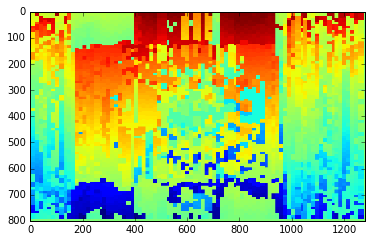

 [[ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
494.0
494.0
494.0
494.0
494.0
494.0
494.0
494.0
494.0
494.0
494.0
494.0
494.0
494.0
494.0
110.0
110.0
110.0
110.0
110.0
110.0
110.0
110.0
110.0
110.0
110.0
110.0
110.0
110.0
110.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97

730.0
730.0
730.0
730.0
730.0
730.0
730.0
730.0
730.0
730.0
730.0
730.0
730.0
730.0
730.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
671.0
671.0
671.0
671.0
671.0
671.0
671.0
671.0
671.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
1

688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
726.0
726.0
726.0
726.0
726.0
726.0
726.0
726.0
726.0
726.0
726.0
726.0
726.0
726.0
726.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
738.0
738.0
738.0
738.0
738.0
738.0
738.0
738.0
738.0
738.0
738.0
738.0
738.0
738.0
738.0
692.0
692.0
692.0
692.0
692.0
692.0
692.0
692.0
692.0
692.0
692.0
692.0
692.0
692.0
692.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
687.0
739.0
739.0
739.0
739.0
739.0
739.0
739.0
739.0
739.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.

233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
457.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
671.0
671.0
671.0
671.0
671.0
671.0
671.0
671.0
671.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
684.0
684.0
684.0
6

723.0
723.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
728.0
712.0
712.0
712.0
712.0
712.0
712.0
712.0
712.0
712.0
712.0
712.0
712.0
712.0
712.0
712.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
727.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
729.0
729.0
729.0
729.0
729.0
729.0
729.0
729.0
729.0
729.0
729.0
729.0
729.0
729.0
729.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
378.0
378.0
378.0
378.0
378.0
378.0
378.0
378.0
378.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.

580.0
580.0
580.0
580.0
580.0
657.0
657.0
657.0
657.0
657.0
657.0
657.0
657.0
657.0
657.0
657.0
657.0
657.0
657.0
657.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
632.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
118.0
118.0
118.0
118.0
118.0
118.0
118.0
118.0
118.0
118.0
118.0
118.0
118.0
118.0
118.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
146.0
146.0
146.0
146.0
146.0
146.0
146.0
146.0
146.0
146.0
146.0
14

701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
120.0
120.0
120.0
120.0
120.0
120.0
120.0
120.0
120.0
120.0
120.0
120.0
120.0
120.0
120.0
575.0
575.0
575.0
575.0
575.0
575.0
575.0
575.0
575.0
575.0
575.0
575.0
575.0
575.0
575.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
379.0
622.0
622.0
622.0
622.0
622.0
622.0
622.0
622.0
622.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
672.0
6

720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
720.0
743.0
743.0
743.0
743.0
743.0
743.0
743.0
743.0
743.0
740.0
740.0
740.0
740.0
740.0
740.0
740.0
740.0
740.0
740.0
740.0
740.0
740.0
740.0
740.0
734.0
734.0
734.0
734.0
734.0
734.0
734.0
734.0
734.0
734.0
734.0
734.0
734.0
734.0
734.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
737.0
737.0
737.0
737.0
737.0
737.0
737.0
737.0
737.0
737.0
737.0
737.0
737.0
737.0
737.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
713.0
713.0
713.0
713.0
713.

146.0
146.0
146.0
146.0
624.0
624.0
624.0
624.0
624.0
624.0
624.0
624.0
624.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
60.0
60

735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
735.0
721.0
721.0
721.0
721.0
721.0
721.0
721.0
721.0
721.0
721.0
721.0
721.0
721.0
721.0
721.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
733.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
732.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
724.0
710.0
710.0
710.0
710.0
710.0
710.0
710.0
710.0
710.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.

67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
6

67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
653.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
697.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
708.0
708.0
708.0
708.0
708.0
708.0
708.0
708.0
708.0
7

57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
429.0
429.0
429.0
429.0
429.0
429.0
429.0
429.0
429.0
429.0
429.0
429.0
429.0
429.0
429.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
628.0
628.0
628.0
628.0
628.0
628.0
628.0
628.0
628.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
642.0
642.0
642.0
642.0
642.0
642.0
642.0
642.0
642.0
642.0
642.0
642.0
642.0
642.0
642.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
568.0
568.0
568.0
568.0
568.0
568.0
568.0
568.0
568.0
568.0
568.0
568.0
568.0
568.0
568.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
606.0
606.0
606.0
606.0
606.0
606.0
606.0
606.0
606.0
6

366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
329.0
329.0
329.0
329.0
329.0
329.0
329.0
329.0
329.0
329.0
329.0
329.0
329.0
329.0
329.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
693.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
702.0
731.0
731.0
731.0
731.0
731.0
731.0
731.0
731.0
731.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.

159.0
159.0
159.0
159.0
159.0
592.0
592.0
592.0
592.0
592.0
592.0
592.0
592.0
592.0
592.0
592.0
592.0
592.0
592.0
592.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
214.0
214.0
214.0
214.0
214.0
214.0
214.0
214.0
214.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
45.0
45.0


685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
685.0
683.0
683.0
683.0
683.0
683.0
683.0
683.0
683.0
683.0
683.0
683.0
683.0
683.0
683.0
683.0
681.0
681.0
681.0
681.0
681.0
681.0
681.0
681.0
681.0
681.0
681.0
681.0
681.0
681.0
681.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
414.0
414.0
414.0
414.0
414.0
414.0
414.0
414.0
414.0
414.0
414.0
414.0
414.0
414.0
414.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
189.0
189.0
189.0
189.

688.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
709.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
707.0
707.0
707.0
707.0
707.0
707.0
707.0
707.0
707.0
707.0
707.0
707.0
707.0
707.0
707.0
696.0
696.0
696.0
696.0
696.0
696.0
696.0
696.0
696.0
696.0
696.0
696.0
696.0
696.0
696.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
699.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
690.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
691.0
685.

333.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
663.0
663.0
663.0
663.0
663.0
663.0
663.0
663.0
663.0
663.0
663.0
663.0
663.0
663.0
663.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
688.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
679.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
713.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
701.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
704.0
691.0
691.0
691.0
691.0
691.0
691.

-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
622.0
622.

519.0
519.0
519.0
519.0
519.0
519.0
519.0
519.0
519.0
495.0
495.0
495.0
495.0
495.0
495.0
495.0
495.0
495.0
495.0
495.0
495.0
495.0
495.0
495.0
531.0
531.0
531.0
531.0
531.0
531.0
531.0
531.0
531.0
531.0
531.0
531.0
531.0
531.0
531.0
576.0
576.0
576.0
576.0
576.0
576.0
576.0
576.0
576.0
576.0
576.0
576.0
576.0
576.0
576.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
129.0
129.0
129.0
129.0
129.0
129.0
129.0
129.0
129.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.

437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
0.0
0.0

520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
520.0
407.0
407.0
407.0
407.0
407.0
407.0
407.0
407.0
407.0
570.0
570.0
570.0
570.0
570.0
570.0
570.0
570.0
570.0
570.0
570.0
570.0
570.0
570.0
570.0
545.0
545.0
545.0
545.0
545.0
545.0
545.0
545.0
545.0
545.0
545.0
545.0
545.0
545.0
545.0
527.0
527.0
527.0
527.0
527.0
527.0
527.0
527.0
527.0
527.0
527.0
527.0
527.0
527.0
527.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
41

284.0
284.0
284.0
284.0
284.0
284.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
655.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
677.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
676.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
674.0
672.0
672.0
672.0
672.0
672.0
672.0
672.0
672.0
672.0
672.0
672.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
512.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
1.0
1.0
1.0
1.0
1.0
1.0
1

640.0
640.0
640.0
640.0
640.0
640.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
649.0
649.0
649.0
649.0
649.0
649.0
649.0
649.0
649.0
649.0
649.0
649.0
649.0
649.0
649.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
654.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
631.0
674.0
674.0
674.0
674.0
674.

634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
648.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
269.0
269.

648.0
648.0
648.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
641.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.

627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
597.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
639.0
639.0
639.0
639.0
639.0
639.0
639.0
639.0
639.0
639.0
639.0
639.0
639.0
639.0
639.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
638.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
640.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
636.0
636.0
636.

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
644.0
644.0
644.0
644.0
644.0
644

376.0
376.0
376.0
376.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-40.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2

453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
210.0
210.0
210.0
210.0
210.0
210.0
210.0
210.0
210.0
210.0
210.0
210.0
210.0
210.0
210.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.

533.0
533.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
552.0
552.0
552.0
552.0
552.0
552.0
552.0
552.0
552.0
552.0
552.0
552.0
552.0
552.0
552.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
600.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
625.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
577.0
645.0
645.0
645.0
645.0
645.0
645.0
645.0
645.0
645.0
645.0
645.0
645.0
645.0
645.0
645.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
627.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
6

627.0
627.0
627.0
627.0
627.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
626.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
601.0
202.0
202.0
202.0
202.0
202.0
202.0
202.0
202.0
202.0
202.0
202.0
202.0
202.0
202.0
202.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
585.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
646.0
646.0
646.0
646.0
646.0
646.0
646.0
646.0
646.0
646.0
646.0
646.0
646.0
646.0
646.0
503.0
503.0
503.0
503.0
503.0
503.0
503.0
503.0
503.0
503.0
503.0
503.0
503.0
503.0
503.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
644.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
633.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.

545.0
545.0
545.0
545.0
545.0
545.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
542.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
546.0
564.0
564.0
564.0
564.0
564.0
564.0
564.0
564.0
564.0
562.0
562.0
562.0
562.0
562.0
562.0
562.0
562.0
562.0
562.0
562.0
562.0
562.0
562.0
562.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.

370.0
370.0
370.0
370.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
522.0
522.0
522.0
522.0
522.0
522.0
522.0
522.0
522.0
522.0
522.0
522.0
522.0
522.0
522.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
510.0
510.0
510.0
510.0
510.0
510.0
510.0
510.0
510.0
510.0
510.0
510.0
510.0
510.0
510.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
364.0
364.0
364.0
364.0
364.0
364.0
364.0
364.0
364.0
364.0
364.0
364.0
364.0
364.0
364.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
519.0
519.0
519.0
519.0
519.0
519.0
519.0
519.0
519.0
519.0
519.0
519.0
519.

533.0
533.0
533.0
533.0
533.0
537.0
537.0
537.0
537.0
537.0
537.0
537.0
537.0
537.0
537.0
537.0
537.0
537.0
537.0
537.0
541.0
541.0
541.0
541.0
541.0
541.0
541.0
541.0
541.0
541.0
541.0
541.0
541.0
541.0
541.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
536.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
551.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
634.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
652.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.

338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.

180.0
180.0
180.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
307.0
307.0
307.0
307.0
307.0
307.0
307.0
307.0
307.0
307.0
307.0
307.0
307.0
307.0
307.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
198.0
198.0
198.0
198.0
198.0
198.0
198.0
198.0
198.0
198.0
198.0
198.0
198.0
198.0
198.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
24

501.0
501.0
501.0
501.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
505.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
636.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
139.0
489.0
489.0
489.0
489.

285.0
285.0
285.0
285.0
285.0
285.0
285.0
285.0
285.0
285.0
285.0
285.0
285.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
448.0
448.0
448.0
448.0
448.0
448.0
448.0
448.0
448.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
138.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
307.0
307.0
307.0
307.

635.0
635.0
635.0
635.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
616.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
630.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
635.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0
339.0
339.0
339.0
339.0
339.0
339.0
339.0
339.0
339.0
339.0
339.0
339.0
339.

0.0
0.0
0.0
0.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
214.0
214.0
214.0
214.0
214.0
214.0
214.0
214.0
214.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0


209.0
209.0
209.0
209.0
209.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
214.0
214.0
214.0
214.0
214.0
214.0
214.0
214.0
214.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
523.0
523.0
523.0
523.0
523.0
523.0
523.0
523.0
523.0
523.0
523.0
523.

259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.

374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
335.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
619.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
225.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
481.0
481.0
481.0
481.0
481.0
481.0
481.0
481.0
481.0
481.0
481.0
481.0
481.

364.0
364.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
262.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
237.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
189.0
189.0
189.0
189.0
189.0
189.0
189.0
189.0
189.0
189.0
189.0
189.0
189.0
189.0
189.0
287.0
287.0
287.0
287.0
287.0
287.0
287.0
287.0
287.0
287.0
287.0
287.0
287.0
287.0
287.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
290.0
290.0
290.0
290.0
290.0
290.0
290.0
290.0
290.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.0
515.

274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
282.0
181.0
181.0
181.0
181.0
181.0
181.0
181.0
181.0
181.0
256.0
256.0
256.0
256.0
256.0
256.0
256.0
256.0
256.0
256.0
256.0
256.0
256.0
256.0
256.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
343.0
343.0
343.0
343.0
343.0
343.0
343.0
343.0
343.0
343.0
343.0
343.0
343.0
343.0
343.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
149.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
3

481.0
481.0
481.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
500.0
500.0
500.0
500.0
500.0
500.0
500.0
500.0
500.0
500.0
500.0
500.0
500.0
500.0
500.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
497.0
488.0
488.0
488.0
488.0
488.0
488.0
488.0
488.0
488.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
489.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
467.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.

452.0
452.0
452.0
452.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
261.0
261.0
261.0
261.0
261.0
261.0
261.0
261.0
261.0
261.0
261.0
261.0
261.0
261.0
261.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
209.0
242.0
242.0
242.0
242.0
242.0
242.0
242.0
242.0
242.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
485.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
482.0
482.0
482.0
482.0
482.0
482.0
482.0
482.0
482.0
482.0
482.0
482.0
482.

444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
437.0
439.0
439.0
439.0
439.0
439.0
439.0
439.0
439.0
439.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
436.0
4

175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
153.0
153.0
153.0
153.0
153.0
153.0
153.0
153.0
153.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
317.0
317.0
317.0
317.0
317.0
317.0
317.0
317.0
317.0
317.0
3

452.0
452.0
452.0
452.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
219.0
219.0
219.0
219.0
219.0
219.0
219.0
219.0
219.0
219.0
219.0
219.0
219.0
219.0
219.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
444.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
441.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
4

254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
478.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
471.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
532.0
554.0
554.0
554.0
554.0
554.0
554.0
554.0
554.0
554.0
554.0
554.0
554.0
554.0
554.0
554.0
492.0
492.0
492.0
492.0
492.0
492.0
492.0
492.0
492.0
492.0
492.0
492.0
492.0
492.0
492.0
476.0
476.0
476.

112.0
112.0
112.0
112.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
208.0
208.0
208.0
208.0
208.0
208.0
208.0
208.0
208.0
217.0
217.0
217.0
217.0
217.0

221.0
221.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
284.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
208.0
208.0
208.0
208.0
208.0
208.0
208.0
208.0
208.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
480.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.0
490.

302.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
259.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
191.0
191.0

-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
455.0
455.0
455.0
455.0
455.0
455.0
455.0
455.0
455.0
455.0
455.0
455.0
455.0
455.0
455.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
452.0
451.0
451.0
451.0
451.0
451.0
451.0
451.0
451.0
451.0
451.0
451.0
451.0
451.0
451.0
451.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
491.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.

470.0
470.0
470.0
470.0
470.0
470.0
470.0
473.0
473.0
473.0
473.0
473.0
473.0
473.0
473.0
473.0
473.0
473.0
473.0
473.0
473.0
473.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
466.0
484.0
484.0
484.0
484.0
484.0
484.0
484.0
484.0
484.0
484.0
484.0
484.0
484.0
484.0
484.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
450.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
460.0
460.0
460.0
460.0
460.0
460.0
460.0
460.0
460.0
460.0
460.0
460.0
460.0
460.0
460.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
462.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
560.0
560.0
560.0
560.0
560.0
560.0
560.0
560.0
560.0
560.

126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
186.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
289.

183.0
183.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
409.0
409.0
409.0
409.0
409.0
409.0
409.0
409.0
409.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
411.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
247.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
92.0
92

223.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
27

-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
-109.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0


446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
548.0
548.0
548.0
548.0
548.0
548.0
548.0
548.0
548.0
548.0
548.0
548.0
548.0
548.0
548.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
409.0
409.0
409.0
409.0
409.0
409.0
409.0
409.0
409.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
547.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
-111.0
304.0
304.0
3

215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
453.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
458.0
443.0
443.0
443.0
443.0
443.0
443.0
443.0
443.0
443.0
443.0
443.0
443.0
443.0
443.0
443.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
442.0
470.0
470.0
470.0
470.0
470.0
470.0
470.0
470.0
470.0
470.0
470.0
470.0
470.0
470.0
470.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
507.0
487.0
487.0
487.0
487.0
487.0
487.0
487.0
487.0
487.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
449.0
445.0
445.0
445.0
445.0
445.0
445.0
445.0
445.0
445.0
445.0
445.0
445.0
445.0
445.0
445.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.0
446.

-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
447.0
447.0
447.0
447.0
447.0
447.0
447.0
447.0
447.0
447.0
447.0
447.0
447.0
447.0
447.0
474.0
474.0
474.0
474.0
474.0
474.0
474.0

384.0
384.0
384.0
384.0
384.0
384.0
384.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
384.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
2

426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
426.0
433.0
433.0
433.0
433.0
433.0
433.0
433.0
433.0
433.0
434.0
434.0
434.0
434.0
434.0
434.0
434.0
434.0
434.0
434.0
434.0
434.0
434.0
434.0
434.0
430.0
430.0
430.0
430.0
430.0
430.0
430.0
430.0
430.0
430.0
430.0
430.0
430.0
430.0
430.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
431.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
399.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
180.0
180.0
180.0
180.0
180.

242.0
242.0
242.0
242.0
242.0
242.0
242.0
242.0
242.0
242.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
1

502.0
502.0
502.0
502.0
502.0
502.0
502.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
418.0
418.0
418.0
418.0
418.0
418.0
418.0
418.0
418.0
418.0
418.0
418.0
418.0
418.0
418.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
227.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
463.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
440.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
499.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
432.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
378.0
378.0
378.0
378.0
378.0
378.0
378.0
3

416.0
416.0
416.0
416.0
416.0
416.0
416.0
416.0
416.0
416.0
416.0
416.0
416.0
416.0
416.0
416.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
381.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
377.0
377.0
377.0
377.0
377.0
377.0
377.0
377.0
377.0
173.0
173.0
173.0
173.0
173.0
173.0
173.0
173.0
173.0
173.0
173.0
173.0
173.0
173.0
173.0
514.0
514.0
514.0
514.0
514.0
514.0
514.0
514.0
514.0
514.0
514.0
514.0
514.0
514.0
514.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
501.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
518.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
357.0
357.0
357.0
3

246.0
246.0
246.0
246.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-12.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5

378.0
378.0
378.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
-145.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
397.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
-23.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
246.0
246.0
246.0
246.0
246.0
246.0
246.

-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
-168.0
-168.0
-168.0
-168.0
-168.0
-168.0
-168.0
-168.0
-168.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
-30.0
502.0
502.0
502.0
502.0
502.0
502.0
502.0
502.0
502.0
502.0
502.0
502.0
502.0
502.0
502.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
406.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
391.0
-152.0
-152.0
-152.

396.0
396.0
396.0
396.0
396.0
396.0
396.0
396.0
403.0
403.0
403.0
403.0
403.0
403.0
403.0
403.0
403.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
402.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
401.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.

187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
187.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
240.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
-20.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
117.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
90.0
90.0
90.0
90.0

-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
374.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
493.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
122.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
-168.0
-168.0
-168.0
-168.0
-168.0
-168.0
-168.0
-168.0
-168.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
183.0
18

349.0
349.0
349.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
362.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
358.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
355.0
355.0
355.0
355.0
355.0
355.0
355.0
355.0
355.0
355.0
355.0
355.0
355.0
355.0
355.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
341.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
464.0
464.0
464.0
464.0
464.0
464.0
464.0
464.0
464.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
271.0
2

345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
345.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
412.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
-173.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
369.0
369.0
369.0
369.0
369.0
369.0
369.0
369.0
369.0
369.0
369.0
369.0
369.0
369.

-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
257.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
204.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
206.0
206.0
206.0
206.0
2

464.0
464.0
464.0
464.0
464.0
464.0
464.0
464.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
270.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
271.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.0
179.

140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
410.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
388.0
388.0
388.0
388.0
388.0
388.0
388.0
388.0
388.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
387.0
459.0
459.0
459.0
459.0
459.0
459.0
459.0
459.0
459.0
459.0
459.0
459.0
459.0
459.0
459.0
372.0
372.0
372.0
372.0
372.0
372.0
372.0
372.0
372.0
372.0
372.0
372.0
372.0
372.0
372.0
363.0
363.0
363.0
363.0
363.0
363.0
363.

177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
184.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.

-44.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
134.0
134.0
134.0
134.0
134.0
134.0
134.0
134.0
134.0
134.0
134.0
134.0
134.0
134.0
134.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
461.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
371.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
376.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
385.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
394.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
366.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
373.0
372.

167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
167.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
-57.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
141.0
1

-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
357.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
1

-189.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
309.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
113.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0


-15.0
-15.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
348.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.

175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
175.0
172.0
172.0
172.0
172.0
172.0
172.0
172.0
172.0
172.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
-4.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
169.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
302.0
302.0
302.0
302.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0
363.0

163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
356.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.

24.0
24.0
24.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
347.0
3

24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
165.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
-79.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
365.0
347.0
347.0
347.0
347.0
347.0
347.

-336.0
-336.0
-336.0
-336.0
-336.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
380.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
351.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
-189.0
323.0
323.0
323.0
323.0
323.0
323.0
323.0
323.0
323.0
312.0
312.0
312.0
312.0
312.0
312.0
312.0
312.0
312.0
312.0
312.0
312.0
312.0
312.0
312.0
298.0
298.0
298.0
298.0
298.0
298.0
298.0
298.0
298.0
298.0
298.0
298.0
298.0
298.0
298.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
281.0
-28.0
-28.0
-2

330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
330.0
349.0
349.0
349.0
349.0
349.0
349.0
349.0
349.0
349.0
349.0
349.0
349.0
349.0
349.0
349.0
332.0
332.0
332.0
332.0
332.0
332.0
332.0
332.0
332.0
332.0
332.0
332.0
332.0
332.0
332.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
340.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
350.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
321.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
328.0
424.0
424.0
424.0
424.0
424.0
424.0
424.0
424.0
424.0
424.0
424.0
424.0
424.0
424.0
424.0
415.0
415.0
415.0
415.0
415.0
415.0
415.0
415.0
415.0
415.0
415.0
415.0
415.0
415.0
415.0
327.0
327.0
327.0
327.0
327.0
327.0
327.0
327.0
327.0
327.0
327.0
327.0
327.0
327.0
327.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
-234.0
297.0
297.0
297.0
297.0
2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
128.0
128.0
128.0
128.0
128.0
128.0
128.0
128.0
128.0
128.0
128.0
128.0
128.0
128.0
128.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
330.0
330.0
330.0
330.0
330.0
330.0


89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
-76.0
-76.0
-76.0
-76.0
-76.0
-76.0
-76.0
-76.0
-76.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
107.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
380.0


265.0
265.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
-72.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
-76.0
-76.0
-76.0
-76.0
-76.0
-76.0
-76.0
-76.0
-76.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-86.

82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
-82.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
140.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
79.0
79.0
79.0
79

22.0
22.0
22.0
22.0
22.0
22.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
-112.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0

387.0
387.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
324.0
324.0
324.0
324.0
324.0
324.0
324.0
324.0
324.0
324.0
324.0
324.0
324.0
324.0
324.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
326.0
326.0
326.0
326.0
326.0
326.0
326.0
326.0
326.0
326.0
326.0
326.0
326.0
326.0
326.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
269.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89

256.0
256.0
256.0
256.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
264.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
248.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.

118.0
118.0
118.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
125.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
302.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.0
291.

-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
-75.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
-124.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
322.0
322.0
322.0
322.0
322.0
322.0
322.0
322.0
322.0
322.0
322.0
322.0
322.0
322.0
322.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-274.0
-274.0
-274.0
-274.0
-274.0
-274.0
-274.0
-274.0
-274.0
-274.0
-274.0
-274.0
-274.0
-274.0
-2

292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
292.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
361.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
310.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
305.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
276.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
346.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
370.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
297.0
273.0
273.0
273.0
273.0
273.0
273.0
273.0
273.0
273.0
273.0
273.0
273.0
273.0
273.0
273.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
389.0
244.0
244.0
244.0
244.0
244.0
244.

11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
111.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
304.0
304.0
304.0
304.0
304.0
304.0
304.0
304.0
304.0
304.0
304.0
304.0
304.0


-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-110.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-140.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11

-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-87.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
231.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-86.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
-92.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
261.0
261.0
261.0
261.0
261.0
261.0
2

368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-73.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0

221.0
221.0
221.0
221.0
221.0
221.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-99.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


360.0
360.0
360.0
360.0
360.0
360.0
360.0
360.0
360.0
360.0
360.0
360.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
243.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
368.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
229.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
228.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
2

-153.0
-153.0
-153.0
-153.0
-153.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
280.0
280.0
280.0
280.0
280.0
280.0
280.0
280.0
280.0
280.0
280.0
280.0
280.0
280.0
280.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
289.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
344.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
353.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0

22.0
22.0
22.0
22.0
22.0
22.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-167.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
-142.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
20.0
20.

84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
-7.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
254.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0
250.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
266.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
274.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.0
246.

104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-153.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-83.0
-64.0
-64.0
-64.0
-64.0
-64.0
-64.0
-64.0
-64.0
-64.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-13

338.0
338.0
338.0
338.0
338.0
338.0
338.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
91.0
91.0
91.0
91.0
91.0
91.0
91.0
91.0
91.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
-194.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
-104.0
-104.0
-104.0
-104.0


236.0
236.0
236.0
236.0
236.0
236.0
236.0
236.0
236.0
236.0
236.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
331.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
336.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
213.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
212.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
338.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
193.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
211.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.

6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
0.0

-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-198.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-177.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0
-183.0


-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
-89.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-209.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-144.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
-169.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
-183.0
-183.0
-18

217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
217.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
103.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
-281.0
-281.0
-281.0
-281.0
-281.0
-281.0
-281.0
-281.0
-281.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
-375.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
303.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
299.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
301.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
-342.0
-342.0
-342.0
-342.0
-342.0
-342.0
-342.0
-342.0
-342.0
-342.0
-342.0
-342.0
-342

179.0
179.0
179.0
179.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
178.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
-335.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-208.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
78.0

272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
315.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
190.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
321.0
321.0
321.0
321.0
321.0
321.

236.0
236.0
236.0
236.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
244.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
201.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
223.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
319.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
222.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
320.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
191.0
191.0
191.0
191.0
191.0
191.0
191.

207.0
207.0
207.0
207.0
207.0
207.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-384.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
-21.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

271.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
207.0
207.0
207.0
207.0
207.0
207.0
207.0
207.0
207.0
207.0
207.0
207.0
207.0
207.0
207.0
206.0
206.0
206.0
206.0
206.0
206.0
206.0
206.0
206.0
206.0
206.0
206.0
206.0
206.0
206.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
300.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
306.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
308.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-37.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
-43.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-112

-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
-36.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-13.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0
-53.0

-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-67.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-215.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-93.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-114.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0

-365.0
-365.0
-365.0
-365.0
-365.0
-365.0
-365.0
-365.0
-365.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-377.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
221.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-402.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-29.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-

160.0
160.0
160.0
160.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-45.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.

-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-6.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
-38.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-245.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
-202.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
-229.0
-229.0
-229.0
-229.0
-229.0
-229.0
-229.0
-229.0
-2

91.0
91.0
91.0
91.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
114.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
159.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
197.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
23

293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
286.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
-128.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
293.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
234.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-41.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
92.0
92.0
92.

278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-136.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
218.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-58.0
-

230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
252.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
251.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
265.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
177.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
-385.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
267.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
277.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
278.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
275.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
272.0
2

-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
163.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
182.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.

-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
-231.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-77.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0


-124.0
-124.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-103.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-123.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
-68.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-266.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42

168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
183.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
155.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
226.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
249.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
162.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
161.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
133.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
260.0
262.0
262.0
262.0
262.0
262.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-42.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-165.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-218.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-121.0
-121.0
-121.0
-121.0
-121.0
-121.0
-121.0
-121.0
-121.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-

-291.0
-291.0
-291.0
-291.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-232.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-32.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-121.0
-121.0
-121.0
-121.0
-121.0
-121.0
-121.0
-121.0
-121.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
-90.0
241.0
241.0
241.0
241.0
241.0
241.0
241.0
241.0
241.0
241.0
241.0
241.0


-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-138.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-164.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-272.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-287.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0

-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-63.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-46.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-19.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-88.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-126.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-282.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-277.0
-138.0
-138.0
-138.0
-138

-116.0
-116.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
-101.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
136.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
220.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
152.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
145.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
126.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
235.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0
132.0

132.0
132.0
132.0
132.0
131.0
131.0
131.0
131.0
131.0
131.0
131.0
131.0
131.0
131.0
131.0
131.0
131.0
131.0
131.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
224.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
230.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
104.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
233.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
-119.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
216.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
-91.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.

-280.0
-280.0
-280.0
-280.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-242.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-133.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-291.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-65.0
-65.0
-65.0
-65.0
-65

81.0
81.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
-60.0
205.0
205.0
205.0
205.0
205.0
205.0
205.0
205.0
205.0
205.0
205.0
205.0
205.0
205.0
205.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
-477.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
-539.0
-539.0
-539.0
-539.0
-539.0
-539.0
-53

-303.0
-303.0
-303.0
-303.0
-303.0
-303.0
-303.0
-303.0
-303.0
-303.0
-303.0
-303.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-321.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-47.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-50.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-289.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-

-127.0
-127.0
-127.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-51.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-80.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-78.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-288.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-187.0
-197

100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
-458.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
154.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
196.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
-456.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
154.0
154.0
154.0
154.

87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
215.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
200.0
200.0
200.0
200.0
200.0
200.0
200.0
200.0
200.0
200.0
200.0
200.0
200.0
200.0
200.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-286.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
192.0
-458.0
-458.0
-4

105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
105.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
116.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
203.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.0
185.

-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
199.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
191.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
174.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
115.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
124.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
166.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
102.0
102.0
102.0
102.0


-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-336.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-151.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-116.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-74.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-69.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
199.0
199.0
199

-197.0
-197.0
-197.0
-197.0
-197.0
-197.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-320.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-170.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-94.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
-117.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-326.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-350.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-333.0
-183.0
-183.0
-183.0
-183.0
-183.0


123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
123.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
-56.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-543.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-533.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-572.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.

-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
168.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
109.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
-542.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
143.0
-528.0
-528.0
-528.0
-528

86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
176.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
188.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-258.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
-273.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
170.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-141.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
147.0
1

-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-132.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-81.0
-81.0
-81.0
-81.0
-81.0
-81.0
-81.0
-81.0
-81.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-178.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-125.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-225.0
-160.0
-160.0
-160.0
-160.0
-160.0
-160.0
-160.0
-160.0
-160.0
-160.0
-160.0
-

61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-120.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-156.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-191.0
-254.0
-

93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
171.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
144.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
-596.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
142.0
142.0
142.0
142.0
1

-166.0
-166.0
-166.0
-166.0
-166.0
-166.0
-166.0
-166.0
-166.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
160.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
148.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
137.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71

86.0
86.0
86.0
86.0
86.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
-352.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
-244.0
-244.0
-244.0
-244.0
-244.0
-244.0
-24

52.0
52.0
52.0
52.0
52.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
-523.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
142.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-154.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
164.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0

29.0
29.0
29.0
29.0
29.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-356.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-511.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-296.0
-295.0
-295.0
-295.0
-295.0
-295.0
-295.0
-295.0
-295.0
-295.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
40.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0


-137.0
-137.0
-137.0
-137.0
-137.0
-137.0
-137.0
-137.0
-137.0
-137.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-254.0
-254.0
-254.0
-254.0
-254.0
-254.0
-254.0
-254.0
-254.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
109.0
109.0
109.0
109.0
109.0


-404.0
-404.0
-404.0
-404.0
-404.0
-404.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-212.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-217.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-130.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-349.0
-226.0
-226.0
-226.0
-226.0
-226.0
-226.0
-226.0
-226.0
-226.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-181.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
-174.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.

-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-347.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-107.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-260.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-280.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-118.0
-118.0
-118.0
-118.0
-118.0
-118.0
-118.0
-118.0
-118.0
-118.0
-118.0
-118.0
-118.0
-118.0

-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-147.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-148.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-368.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-106.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-155.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
-176.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0

-549.0
-549.0
-549.0
-549.0
-549.0
-549.0
-549.0
-549.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-623.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
27.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-561.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
-597.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
75

-149.0
-149.0
-149.0
-149.0
-149.0
-149.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
-206.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
130.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-5

-558.0
-558.0
-558.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-635.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
41.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-

112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
112.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
119.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
-62.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
92.0
92.0
92.0
92.0

-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-583.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-584.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-558.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-573.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-552.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
-557.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
26.0
26.0
26.0
26.0
26.0
26.0

-650.0
-650.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-569.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-415.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-105.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-230.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-237.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-239.0
-239.0
-239.0
-239.0
-239.0
-239.0
-239.0
-239.0
-239.0
-239.

67.0
67.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
-633.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-647.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
-648.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84

-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-104.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-351.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-392.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-131.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-184.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
-205.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-171.0
-246.0
-246.0

-570.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-599.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-571.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-581.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-562.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-563.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-579.0
-579.0
-579.0
-579.0
-579.0
-579.0
-579.0

-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-255.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-257.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-398.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-567.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-575.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-577.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0
-630.0

68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-650.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-665.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0


50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-667.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-602.0
-664.0
-66

-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-139.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-214.0
-292.0
-292.0
-292.0
-292.0
-292.0
-292.0
-292.0
-292.0
-292.0
-292.0
-292.0
-292.0
-292.0
-292.

-680.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-604.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-525.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-243.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-268.0
-340.0
-340.0
-340.0
-340.0
-340.0
-340.0
-340.0
-340.0
-340.0
-269.0
-269.0
-

0.0
0.0
0.0
0.0
0.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-680.0
-682.0
-682.0
-682.0
-682.0
-682.0
-682.0
-682.0
-682.0
-682.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-410.0
-410.0
-410.0

-331.0
-331.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
-695.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
44.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
54.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-688.0
-680.0
-680

-604.0
-604.0
-604.0
-604.0
-605.0
-605.0
-605.0
-605.0
-605.0
-605.0
-605.0
-605.0
-605.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-591.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-593.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-592.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-608.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-610.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-609.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-607.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0

33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-677.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-645.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-619.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-460.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-152.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-340.0
-340.0
-340.0
-340.0
-340.0
-340.0
-340.0
-340.0
-340.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269.0
-269

22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
-312.0
-312.0
-312.0
-312.0
-312.0
-312.0
-312.0
-312.0
-312.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-346.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
-355.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
-624.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50

-171.0
-171.0
-171.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-374.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-192.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-203.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-185.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-297.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-414.0
-302.0
-302.0
-302.0
-302.0
-302.0
-302.0

-152.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-275.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-233.0
-244.0
-244.0
-244.0
-244.0
-244.0
-244.0
-244.0
-244.0
-244.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-369.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-372.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-66.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-509.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-84.0
-485.0
-485.0
-485.0
-485.0
-485.0
-485.0
-485.0
-485.0
-485.0
-485.0
-485.0
-

18.0
18.0
18.0
18.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-690.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-683.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
-659.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-324.0
-327.0
-327.0
-327.0
-327.0
-327.0
-327.0
-327.0
-327.0
-327.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-355.0
-355.0
-355.0
-355.0
-355.0


-44.0
-44.0
-44.0
-44.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-27.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
-325.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-361.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0
-360.0


-641.0
-641.0
-641.0
-641.0
-641.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-626.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-629.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
3.0
-657.0
-657.0
-657.0
-657.0
-657.0
-657.0
-657.0
-657.0
-657.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
-44.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
4.0
4.0
4.0
4.0
4.0
4.0

-641.0
-641.0
-641.0
-641.0
-641.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-660.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-634.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-638.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-649.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-626.0
-626.0
-626.0

-449.0
-449.0
-449.0
-449.0
-449.0
-449.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-127.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-452.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-135.0
-400.0
-400.0
-400.0
-400.0
-400.0
-400.0
-400.0
-400.0
-400.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-646.0
-646.0
-646.0
-646.0


-249.0
-249.0
-249.0
-249.0
-249.0
-249.0
-249.0
-249.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-465.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-188.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-524.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-97.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-328.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-271.0
-400.0
-400.0
-400.0
-400.0
-400.0
-400.0
-400.0
-400.0
-400.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-241.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-625.0
-653.0
-653.0


-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-685.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-637.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-639.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-643.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-646.0
-

-668.0
-668.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-589.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-182.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-305.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-341.0
-457.0
-457.0
-457.0
-457.0
-457.0
-457.0
-457.0
-457.0
-457.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-316.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-179.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-566.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-502.0
-540.0
-540.0
-540.0
-540.0
-540.0
-540.0

0.0
0.0
0.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-679.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-668.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-586.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-515.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-71.0
-379.0
-379.0
-379.0
-379.0
-379.0
-3

-711.0
-711.0
-711.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-15.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-

-22.0
-22.0
-22.0
-22.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-18.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-49.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-17.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-701.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-714.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-711.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-22.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-28.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-

-503.0
-503.0
-503.0
-503.0
-503.0
-503.0
-503.0
-503.0
-503.0
-503.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-195.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-163.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-150.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-143.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-159.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0

-159.0
-159.0
-159.0
-159.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-115.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-122.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-314.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-100.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-642.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-653.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-731.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-661.0
-110.0
-110.0
-110.0
-110.0

-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-530.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-570.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-129.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-186.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-641.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-669.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-95.0
-582.0
-582.0


-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-334.0
-334.0
-334.0
-334.0
-334.0
-334.0
-334.0
-334.0
-334.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-

-2.0
-2.0
-2.0
-2.0
-2.0
-2.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-3.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-5.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-14.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-11.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-9.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-24.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-31.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-33.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691

-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-48.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-691.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-628.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-175.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-306.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-545.0
-334.0
-334.0
-334.0
-334.0
-334.0
-334.0
-334.0
-334.0
-334.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-345.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-190.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595.0
-595

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [28]:
import matplotlib.pyplot as plt
plt.figure('  ')
plt.imshow(image_show)
plt.show()
print(image_show)
np.savetxt('q.txt', image_show)
for i in image_show:
    for ii in i :
        print(ii)

In [ ]:
for items in patch_equal_width[wid].iteritems():
        if items[0] not in dst_photo:
            dst_photo[items[0]] = [0, 999999]
        for i_items in patch_tolerate_width.iteritems():
            dst = np.linalg.norm(np.dot(m_best, np.abs(items[1] - i_items[1])), 2)
            if dst < dst_photo[items[0]][1]:
                dst_photo[items[0]][0] =  items[0][0] - i_items[0][0]
                dst_photo[items[0]][1] =  dst
        image_show[items[0][0]-10: items[0][0]+11 , items[0][1] - 10:items[0][1] +11] = dst
    patch_tolerate_width.clear()
    
for i_items in patch_tolerate_width.iteritems():
    for items in patch_equal_width[wid].iteritems():
        if items[0] not in dst_photo:
            dst_photo[items[0]] = [0, 999999]
        dst = np.linalg.norm(np.dot(m_best, np.abs(items[1] - i_items[1])), 2)
        if dst < dst_photo[items[0]][1]:
                dst_photo[items[0]][0] =  items[0][0] - i_items[0][0]
                dst_photo[items[0]][1] =  dst
patch_tolerate_width.clear() 
for items in dst_photo.iteritems:
    image_show[items[0][0]-10: items[0][0]+11 , items[0][1] - 10:items[0][1] +11] = items[1]
    

            

In [21]:
a = np.array([[1,1,1], [1,1,1]])
print(np.linalg.norm(a,2))

2.44948974278


In [130]:
2.449**2

5.9976009999999995

In [27]:
for (x, y) in range(0:100-11 , 0:100-11):
    print(x,y)

SyntaxError: invalid syntax (<ipython-input-27-3d61131a2b85>, line 1)

In [45]:
a = dict()
a

{}

In [29]:
np.savetxt('a.txt', np.array([[1]]))